## Skeleton Code

The code below provides a skeleton for the model building & training component of your project. You can add/remove/build on code however you see fit, this is meant as a starting point.

In [1]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import os
from glob import glob
%matplotlib inline
import matplotlib.pyplot as plt

##Import any other stats/DL/ML packages you may need here. E.g. Keras, scikit-learn, etc.
from itertools import chain
from random import sample 
import math    

import skimage
from skimage import io

import scipy.stats
from sklearn.model_selection import train_test_split

from workspace_utils import active_session

from sklearn.metrics import roc_curve, auc, precision_recall_curve, average_precision_score, plot_precision_recall_curve, balanced_accuracy_score, precision_score, recall_score, f1_score, confusion_matrix

from keras.preprocessing.image import ImageDataGenerator
from keras.applications.vgg16 import preprocess_input
from keras.models import model_from_json

from keras.layers import Dense, Dropout, Flatten
from keras.models import Sequential, Model
from keras.applications.vgg16 import VGG16
from keras.optimizers import Adam
from keras.callbacks import ModelCheckpoint, LearningRateScheduler, EarlyStopping, ReduceLROnPlateau

Using TensorFlow backend.


## Do some early processing of your metadata for easier model training:

In [2]:
## Below is some helper code to read all of your full image filepaths into a dataframe for easier manipulation
## Load the NIH data to all_xray_df
all_xray_df = pd.read_csv('/data/Data_Entry_2017.csv')
all_image_paths = {os.path.basename(x): x for x in 
                   glob(os.path.join('/data','images*', '*', '*.png'))}
print('Scans found:', len(all_image_paths), ', Total Headers', all_xray_df.shape[0])
all_xray_df['path'] = all_xray_df['Image Index'].map(all_image_paths.get)
all_xray_df.sample(3)

Scans found: 112120 , Total Headers 112120


,Image Index,Finding Labels,Follow-up #,Patient ID,Patient Age,Patient Gender,View Position,OriginalImage[Width,Height],OriginalImagePixelSpacing[x,y],Unnamed: 11,path
104693,00028038_000.png,No Finding,0,28038,47,F,PA,2992,2991,0.143,0.143,NaN,/data/images_011/images/00028038_000.png
40682,00010561_001.png,Mass,1,10561,56,M,PA,2992,2991,0.143,0.143,NaN,/data/images_005/images/00010561_001.png
50925,00012877_002.png,No Finding,2,12877,53,M,PA,2992,2991,0.143,0.143,NaN,/data/images_006/images/00012877_002.png


Inpect data and make any necessary cleanup steps

In [3]:
all_xray_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 112120 entries, 0 to 112119
Data columns (total 13 columns):
 #   Column                       Non-Null Count   Dtype  
---  ------                       --------------   -----  
 0   Image Index                  112120 non-null  object 
 1   Finding Labels               112120 non-null  object 
 2   Follow-up #                  112120 non-null  int64  
 3   Patient ID                   112120 non-null  int64  
 4   Patient Age                  112120 non-null  int64  
 5   Patient Gender               112120 non-null  object 
 6   View Position                112120 non-null  object 
 7   OriginalImage[Width          112120 non-null  int64  
 8   Height]                      112120 non-null  int64  
 9   OriginalImagePixelSpacing[x  112120 non-null  float64
 10  y]                           112120 non-null  float64
 11  Unnamed: 11                  0 non-null       float64
 12  path                         112120 non-null  object 
dtyp

In [4]:
# Remove the 'Unnamed: 11' since it only contains Null values
df_xray_clean = all_xray_df.drop('Unnamed: 11', axis=1)
df_xray_clean.describe()

,Follow-up #,Patient ID,Patient Age,OriginalImage[Width,Height],OriginalImagePixelSpacing[x,y]
count,112120.000000,112120.000000,112120.000000,112120.000000,112120.000000,112120.000000,112120.000000
mean,8.573751,14346.381743,46.901463,2646.078844,2486.438842,0.155649,0.155649
std,15.406320,8403.876972,16.839923,341.246429,401.268227,0.016174,0.016174
min,0.000000,1.000000,1.000000,1143.000000,966.000000,0.115000,0.115000
25%,0.000000,7310.750000,35.000000,2500.000000,2048.000000,0.143000,0.143000
50%,3.000000,13993.000000,49.000000,2518.000000,2544.000000,0.143000,0.143000
75%,10.000000,20673.000000,59.000000,2992.000000,2991.000000,0.168000,0.168000
max,183.000000,30805.000000,414.000000,3827.000000,4715.000000,0.198800,0.198800


In [5]:
# Remove rows where the Patient Age is greater than 100 since it is likely an error in data
df_xray_clean = df_xray_clean[df_xray_clean['Patient Age'] <= 100]
df_xray_clean['Patient Age'].describe()

count    112104.000000
mean         46.872574
std          16.598152
min           1.000000
25%          35.000000
50%          49.000000
75%          59.000000
max          95.000000
Name: Patient Age, dtype: float64

One-Hot Encoding labels to ease the EDA process

In [6]:
## Create extra columns in table with binary indicators of certain diseases 
## from the 'Finding Labels' column

all_labels = np.unique(list(chain(*df_xray_clean['Finding Labels'].map(lambda x: x.split('|')).tolist())))
all_labels = [x for x in all_labels if len(x)>0]

for c_label in all_labels:
    if len(c_label)>1: # leave out empty labels
        df_xray_clean[c_label] = df_xray_clean['Finding Labels'].map(lambda finding: 1.0 if c_label in finding else 0)
df_xray_clean.sample(3)

,Image Index,Finding Labels,Follow-up #,Patient ID,Patient Age,Patient Gender,View Position,OriginalImage[Width,Height],OriginalImagePixelSpacing[x,...,Emphysema,Fibrosis,Hernia,Infiltration,Mass,No Finding,Nodule,Pleural_Thickening,Pneumonia,Pneumothorax
10149,00002633_030.png,No Finding,30,2633,45,F,AP,2500,2048,0.168000,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
100796,00026769_010.png,Atelectasis|Nodule,10,26769,58,M,PA,2021,2021,0.194311,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
78533,00019271_016.png,Atelectasis|Effusion,16,19271,54,M,AP,3052,2544,0.139000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [7]:
## Here we can create a new column called 'pneumonia_class' that will allow us to look at 
## images with or without pneumonia for binary classification

df_xray_clean['pneumonia_class'] = df_xray_clean.Pneumonia == 1

There is around 1.275% of data in this dataset that is account for Pneumonia cases

In [9]:
df_xray_clean['pneumonia_class'], df_xray_clean['pneumonia_class'].mean()

(0         False
 1         False
 2         False
 3         False
 4         False
           ...  
 112115     True
 112116    False
 112117    False
 112118    False
 112119    False
 Name: pneumonia_class, Length: 112104, dtype: bool,
 0.012756012274316705)

## Create your training and testing data:

In [13]:
def create_splits(df, test_size=0.2, random_state=42):
    
    ## Either build your own or use a built-in library to split your original dataframe into two sets 
    ## that can be used for training and testing your model
    ## It's important to consider here how balanced or imbalanced you want each of those sets to be
    ## for the presence of pneumonia
    
    # First, split the train and validation data and ensure that a ratio of
    # positive cases of pneumonia_class are the same in both datasets
    train_data, val_data = train_test_split(df, 
                                   test_size = test_size, 
                                   stratify = df['pneumonia_class'], 
                                   random_state = random_state)
    
    # Next, ensure that we have EQUAL amount of positive and negative cases of pneumonia_class 
    # in Training
    p_inds_train = train_data[train_data.pneumonia_class == 1].index.tolist()
    np_inds_train = train_data[train_data.pneumonia_class == 0].index.tolist()

    np_sample_train = sample(np_inds_train,len(p_inds_train))
    train_data = train_data.loc[p_inds_train + np_sample_train]
    
    # Since we have a very imbalance dataset where there is only 1.275% of
    # data that is account for Pneumonia cases, we will increase a ratio of
    # positive cases (Pneumonia cases) to 20% so can effectively evaluate
    # the performance of our model
    # If we are not doing this, most of the validation data will be negative
    # cases and this will be a problem when calculating metrics (e.g. model will
    # get a good performance if it outputs 0 all the time or it can have a very
    # poor performance if it misclassifies the only positive case in the validation data, etc.)
        
    p_inds_val = val_data[val_data.pneumonia_class == 1].index.tolist()
    np_inds_val = val_data[val_data.pneumonia_class == 0].index.tolist()
    
    # Number of negative cases will be 4 times greater that the positive cases
    np_sample_val = sample(np_inds_val, 4 * len(p_inds_val))
    val_data = val_data.loc[p_inds_val + np_sample_val]
    
    return train_data, val_data

# Now we can begin our model-building & training

#### First suggestion: perform some image augmentation on your data

In [257]:
def my_image_augmentation(horizontal_flip = True,
                          height_shift_range = 0.05,
                          width_shift_range = 0.1,
                          rotation_range = 5, 
                          shear_range = 0.1,
                          zoom_range = 0.05):
    
    ## recommendation here to implement a package like Keras' ImageDataGenerator
    ## with some of the built-in augmentations 
    
    ## keep an eye out for types of augmentation that are or are not appropriate for medical imaging data
    ## Also keep in mind what sort of augmentation is or is not appropriate for testing vs validation data
    
    ## STAND-OUT SUGGESTION: implement some of your own custom augmentation that's *not*
    ## built into something like a Keras package
    
    # preprocess_input function is used to ensured that the data format is suitable for the
    # pretrained vgg16 in keras
    # See the following post for more details:
    # https://stackoverflow.com/questions/47555829/preprocess-input-method-in-keras/47556342#47556342
        
    idg = ImageDataGenerator(rescale = 1. / 255.0,
                              horizontal_flip = horizontal_flip, 
                              vertical_flip = False, 
                              height_shift_range = height_shift_range, 
                              width_shift_range = width_shift_range, 
                              rotation_range = rotation_range, 
                              shear_range = shear_range,
                              zoom_range = zoom_range,
                              preprocessing_function = preprocess_input)
    
    return idg


def make_train_gen(df, IMG_SIZE = (224, 224), batch_size = 128):
    
    ## Create the actual generators using the output of my_image_augmentation for your training data
    ## Suggestion here to use the flow_from_dataframe library, e.g.:
    
#     train_gen = my_train_idg.flow_from_dataframe(dataframe=train_df, 
#                                          directory=None, 
#                                          x_col = ,
#                                          y_col = ,
#                                          class_mode = 'binary',
#                                          target_size = , 
#                                          batch_size = 
#                                          )
     # Todo
    idg = my_image_augmentation()
    train_gen = idg.flow_from_dataframe(dataframe=df, 
                                         directory=None, 
                                         x_col = 'path',
                                         y_col = 'pneumonia_class',
                                         class_mode = 'raw',
                                         shuffle = True,
                                         target_size = IMG_SIZE, 
                                         batch_size = batch_size
                                         )

    return train_gen


def make_val_gen(df, IMG_SIZE = (224, 224), batch_size = 128, shuffle=True):
    
#     val_gen = my_val_idg.flow_from_dataframe(dataframe = val_data, 
#                                              directory=None, 
#                                              x_col = ,
#                                              y_col = ',
#                                              class_mode = 'binary',
#                                              target_size = , 
#                                              batch_size = ) 

    idg = ImageDataGenerator(rescale = 1. / 255.0,
                             preprocessing_function = preprocess_input)
    val_gen = idg.flow_from_dataframe(dataframe=df, 
                                         directory=None, 
                                         x_col = 'path',
                                         y_col = 'pneumonia_class',
                                         class_mode = 'raw',
                                         target_size = IMG_SIZE, 
                                         batch_size = batch_size,
                                         shuffle = shuffle
                                         )
    
    
    # Todo
    return val_gen

In [15]:
train_data, val_data = create_splits(df_xray_clean)

In [16]:
## May want to pull a single large batch of random validation data for testing after each epoch:
val_gen = make_val_gen(val_data)

valX, valY = val_gen.next()

Found 1430 validated image filenames.


In [17]:
train_gen = make_train_gen(train_data)

Found 2288 validated image filenames.


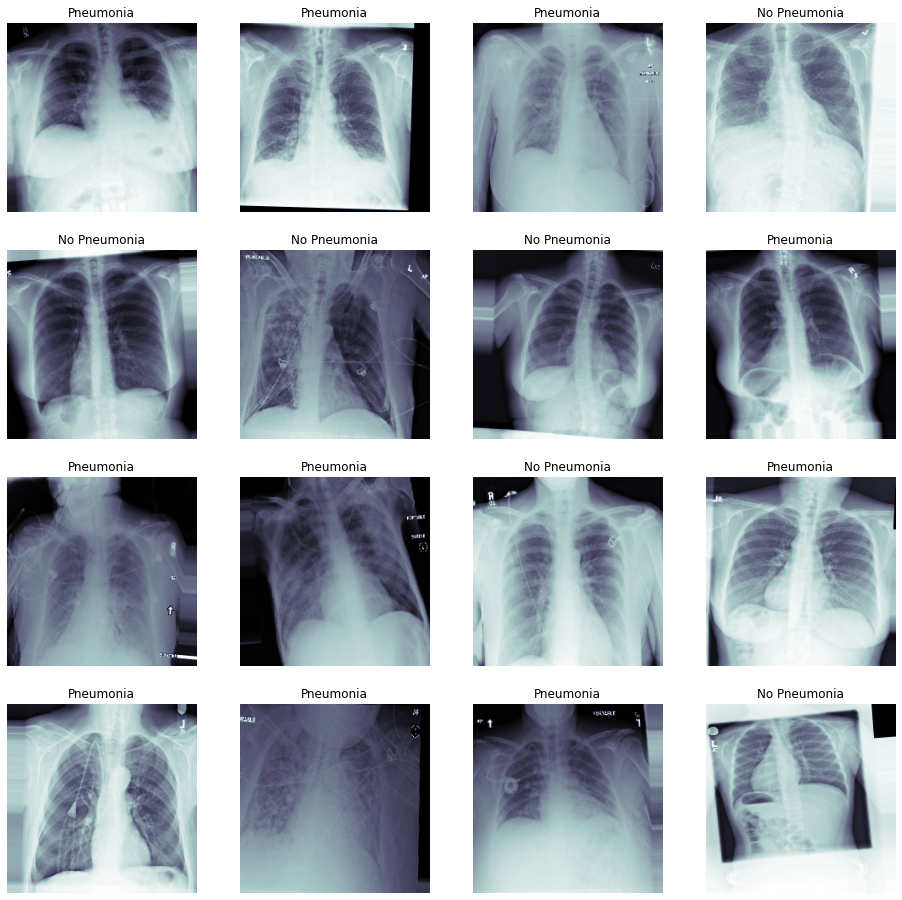

In [18]:
## May want to look at some examples of our augmented training data. 
## This is helpful for understanding the extent to which data is being manipulated prior to training, 
## and can be compared with how the raw data look prior to augmentation

t_x, t_y = next(train_gen)
fig, m_axs = plt.subplots(4, 4, figsize = (16, 16))
for (c_x, c_y, c_ax) in zip(t_x, t_y, m_axs.flatten()):
    c_ax.imshow(c_x[:,:,0], cmap = 'bone')
    if c_y == 1: 
        c_ax.set_title('Pneumonia')
    else:
        c_ax.set_title('No Pneumonia')
    c_ax.axis('off')

## Build your model: 

Recommendation here to use a pre-trained network downloaded from Keras for fine-tuning

In [19]:
def load_pretrained_model():
    
    # Use the pre-trained vgg16 for this transfer learning task
    model = VGG16(include_top=True, weights='imagenet')
    transfer_layer = model.get_layer('block5_pool')
    pretrained_model = Model(inputs=model.input,
                       outputs=transfer_layer.output)

    for layer in pretrained_model.layers[0:17]:
        layer.trainable = False    
    
    return pretrained_model


In [20]:
def build_my_model():
    
    # my_model = Sequential()
    # ....add your pre-trained model, and then whatever additional layers you think you might
    # want for fine-tuning (Flatteen, Dense, Dropout, etc.)
    
    # if you want to compile your model within this function, consider which layers of your pre-trained model, 
    # you want to freeze before you compile 
    
    # also make sure you set your optimizer, loss function, and metrics to monitor
    
    # Todo
    
    new_model = Sequential()

    # Add the convolutional part of the pretrained model.
    pretrainedModel = load_pretrained_model()
    new_model.add(pretrainedModel)

    # Flatten the output of the VGG16 model because it is from a
    # convolutional layer.
    new_model.add(Flatten())

    # Add a dropout-layer which may prevent overfitting and
    # improve generalization ability to unseen data e.g. the test-set.
    new_model.add(Dropout(0.5))

    # Add a dense (aka. fully-connected) layer.
    # This is for combining features that the VGG16 model has
    # recognized in the image.
    new_model.add(Dense(1024, activation='relu'))
    new_model.add(Dropout(0.5))
    
    new_model.add(Dense(512, activation='relu'))
    new_model.add(Dropout(0.2))
    
    new_model.add(Dense(256, activation='relu'))
    new_model.add(Dropout(0.2))

    # Last Layer -> Output a single value
    new_model.add(Dense(1, activation='sigmoid'))
    
    ## Set our optimizer, loss function, and learning rate
    optimizer = Adam(lr=2e-4)
    loss = 'binary_crossentropy'
    metrics = ['binary_accuracy','mae']
    
    new_model.compile(optimizer=optimizer, loss=loss, metrics=metrics)
    
    return new_model



## STAND-OUT Suggestion: choose another output layer besides just the last classification layer of your modele
## to output class activation maps to aid in clinical interpretation of your model's results

In [21]:
## Below is some helper code that will allow you to add checkpoints to your model,
## This will save the 'best' version of your model by comparing it to previous epochs of training

## Note that you need to choose which metric to monitor for your model's 'best' performance if using this code. 
## The 'patience' parameter is set to 10, meaning that your model will train for ten epochs without seeing
## improvement before quitting

# Todo

weight_path="{}_my_model.best.hdf5".format('xray_class')

# Monitor a training loss for this task since the validation loss is very fluctuated in this task
checkpoint = ModelCheckpoint(weight_path, 
                             monitor= 'loss', 
                             verbose=1, 
                             save_best_only=True, 
                             mode= 'min', 
                             save_weights_only = True)

early = EarlyStopping(monitor= 'loss', 
                      mode= 'min', 
                      patience=10)

reduce_lr = ReduceLROnPlateau(monitor='loss', factor=0.25,
                                  patience=3, min_lr=1e-5)

callbacks_list = [checkpoint, early, reduce_lr]

### Start training! 

In [22]:
my_model = build_my_model()
my_model.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
model_1 (Model)              (None, 7, 7, 512)         14714688  
_________________________________________________________________
flatten_1 (Flatten)          (None, 25088)             0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 25088)             0         
_________________________________________________________________
dense_1 (Dense)              (None, 1024)              25691136  
_________________________________________________________________
dropout_2 (Dropout)          (None, 1024)              0         
_________________________________________________________________
dense_2 (Dense)              (None, 512)               524800    
_________________________________________________________________
dropout_3 (Dropout)          (None, 512)              

In [23]:
## train your model

# Todo
with active_session():
    history = my_model.fit_generator(train_gen, 
                              validation_data = (valX, valY), 
                              epochs = 200, 
                              callbacks = callbacks_list)

Epoch 1/200
18/18 [==============================] - 68s 4s/step - loss: 0.7668 - binary_accuracy: 0.5205 - mae: 0.4916 - val_loss: 0.8595 - val_binary_accuracy: 0.2344 - val_mae: 0.5617

Epoch 00001: loss improved from inf to 0.76710, saving model to xray_class_my_model.best.hdf5
Epoch 2/200
18/18 [==============================] - 58s 3s/step - loss: 0.7079 - binary_accuracy: 0.5411 - mae: 0.4878 - val_loss: 0.7054 - val_binary_accuracy: 0.5234 - val_mae: 0.5021

Epoch 00002: loss improved from 0.76710 to 0.70791, saving model to xray_class_my_model.best.hdf5
Epoch 3/200
18/18 [==============================] - 59s 3s/step - loss: 0.6865 - binary_accuracy: 0.5599 - mae: 0.4788 - val_loss: 0.6662 - val_binary_accuracy: 0.6016 - val_mae: 0.4801

Epoch 00003: loss improved from 0.70791 to 0.68671, saving model to xray_class_my_model.best.hdf5
Epoch 4/200
18/18 [==============================] - 56s 3s/step - loss: 0.6726 - binary_accuracy: 0.5900 - mae: 0.4709 - val_loss: 0.6314 - val_b

In [41]:
## Save the history data in case we need it later

# import json   

# with open("train_history.json", "w") as json_file:
#     json.dump(str(history.history), json_file)

In [33]:
# import json
# with open("train_history.json", "r") as json_file:
#     history_json = json_file.read()
        
# y = json.loads(history_json)
# #y

##### After training for some time, look at the performance of your model by plotting some performance statistics:

Note, these figures will come in handy for your FDA documentation later in the project

In [24]:
# with open("my_model.json", "r") as json_file:
#     model_json = json_file.read()
        
# my_model = model_from_json(model_json)

# weight_path= "{}_my_model.best.hdf5".format('xray_class') #path to saved best weights

In [25]:
## After training, make some predictions to assess your model's overall performance
## Note that detecting pneumonia is hard even for trained expert radiologists, 
## so there is no need to make the model perfect.
my_model.load_weights(weight_path)


In [26]:
# Get a predicted output that will be used to evaluate the model performance
pred_Y = my_model.predict(valX, batch_size = 128, verbose = True)

128/128 [==============================] - 1s 9ms/step


In [48]:
def plot_auc(t_y, p_y):
    '''
    Plot a ROC curve and also display the AUC value
    '''
    
    ## Hint: can use scikit-learn's built in functions here like roc_curve
    # https://towardsdatascience.com/10-minutes-to-building-a-fully-connected-binary-image-classifier-in-tensorflow-d88062e1247f

    fpr, tpr, _ = roc_curve(t_y, p_y)
    roc_auc = auc(fpr, tpr)
    plt.figure()
    lw = 2
    plt.plot(fpr, tpr, color='darkorange',
    lw=lw, label='ROC curve (area = %0.2f)' % roc_auc)
    plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate (1-Specificity)')
    plt.ylabel('True Positive Rate (Recall)')
    plt.title('Receiver operating characteristic example')
    plt.legend(loc="lower right")
    plt.show()

## what other performance statistics do you want to include here besides AUC? 

# function to plot the precision_recall_curve. You can utilizat precision_recall_curve imported above
def plot_precision_recall_curve(t_y, p_y):
    '''
    Plot a Precision-Recall curve and also display the average Precision score
    '''
    fig, c_ax = plt.subplots(1,1, figsize = (9, 9))
    precision, recall, thresholds = precision_recall_curve(t_y, p_y)
    c_ax.plot(recall, precision, label = '%s (AP Score:%0.2f)'  % ('Pneumonia', average_precision_score(t_y,p_y)))
    c_ax.set_title('Precision-Recall curve')
    c_ax.legend()
    c_ax.set_xlabel('Recall')
    c_ax.set_ylabel('Precision')
    return precision, recall, thresholds
    
# function to calculate the F1 score
def calc_f1(prec,recall):
    return 2*(prec*recall)/(prec+recall)
    
#Also consider plotting the history of your model training:

def plot_history(history):
    
    ### YOUR CODE HERE
    fig, m_axs = plt.subplots(1,2, figsize = (12, 4))
    m_axs[0].plot(history.history['loss'], label = "Training Loss")
    m_axs[0].plot(history.history['val_loss'], label = "Validation Loss")
    m_axs[0].set(xlabel='Epoch', ylabel='Loss')
    m_axs[0].set_yscale('log')
    m_axs[0].legend()
    m_axs[0].set_title('Training Loss vs Validation Loss');
    
    m_axs[1].plot(history.history['binary_accuracy'], label = "Training Accuracy")
    m_axs[1].plot(history.history['val_binary_accuracy'], label = "Validation Accuracy")
    m_axs[1].set(xlabel='Epoch', ylabel='Accuracy')
    m_axs[1].legend()
    m_axs[1].set_title('Training Accuracy vs Validation Accuracy');


### How did this model perform during the learning process?

The charts below show the model performance during the transfer-learning process. Since we monitored the training loss and applied the EarlyStopping when the training loss is plateaued after 10 epochs, this model stopped learning at the 125 epoch when the training loss was plateaued at 0.13153.

Note that we do not monitor a validation loss/accuracy in this training task due to an imbalanced validation dataset.

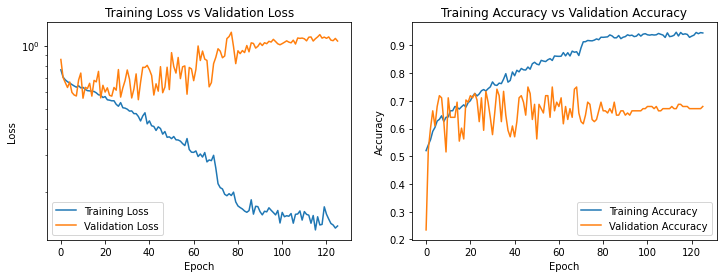

In [49]:
# Log scale
plot_history(history)

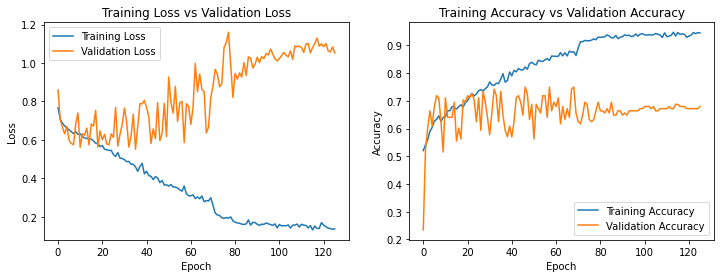

In [29]:
# # Linear y-scale
# plot_history(history)

### What are Performance Statistics of this model?

After the training process was completed, we use the trained model to predict the output of the validation data and use this output to compute the performance statistics below.

### ROC curve

ROC curve is a performance measurement for classification problem at various thresholds settings. ROC is a probability curve and AUC represents degree or measure of separability.  It tells how much model is capable of distinguishing between classes. Higher the AUC, better the model is at predicting 0s as 0s and 1s as 1s. (See more details [here](https://towardsdatascience.com/understanding-auc-roc-curve-68b2303cc9c5))

The plot below shows that the AUC value of the predicted outputs from this model is 0.74 which means that there is 74% chance that this model will be able to distinguish between a positive case (an x-ray image with Pneumonia) and a negative case (an x-ray image without Pneumonia)

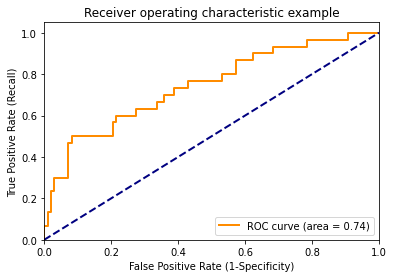

In [589]:
# ROC Curve
plot_auc(valY, pred_Y)

### Precision-Recall Curve

Based on this [post](https://machinelearningmastery.com/roc-curves-and-precision-recall-curves-for-imbalanced-classification/), 

"For imbalanced classification with a severe skew and few examples of the minority class, the ROC AUC can be misleading. This is because a small number of correct or incorrect predictions can result in a large change in the ROC Curve or ROC AUC score." A common alternative is the precision-recall curve and area under curve."

"… precision and recall make it possible to assess the performance of a classifier on the minority class."

"Precision-recall curves (PR curves) are recommended for highly skewed domains where ROC curves may provide an excessively optimistic view of the performance."


The plot below shows that the Precision of this model reduces drastically when increasing the Recall value

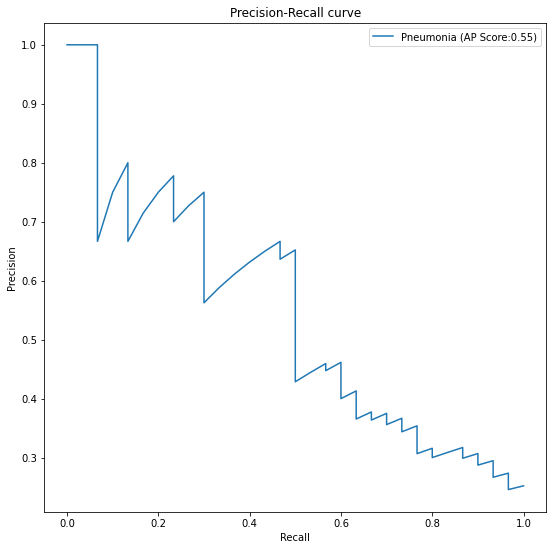

In [48]:
precision, recall, thresholds = plot_precision_recall_curve(valY, pred_Y)

In order to identify a cut-off (threshold) value for our model to classify a positive case, we will select the cut-off value after analyzing the impact of each threshold value against the following metrics:
* Recall
* Precision
* F1 score


In [590]:
# alculate the F1 score first before creating a plot
all_f1 = calc_f1(precision, recall)

The plot below shows the impact of a threshold value against each metric; Precision, Recall, and F1. Base on the initial glance, the threshold between 0.8 to 0.9 seems to give a good balance among those metrics.

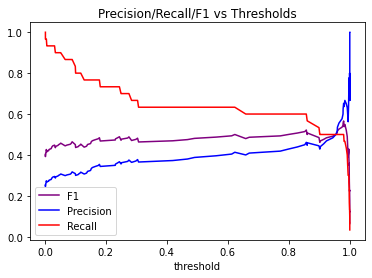

In [594]:
plt.plot(thresholds, all_f1[:-1], color='purple', label="F1")
plt.plot(thresholds, precision[:-1], color='blue', label="Precision")
plt.plot(thresholds, recall[:-1], color='red', label="Recall")

plt.legend()
plt.title('Precision/Recall/F1 vs Thresholds')
plt.xlabel('threshold');

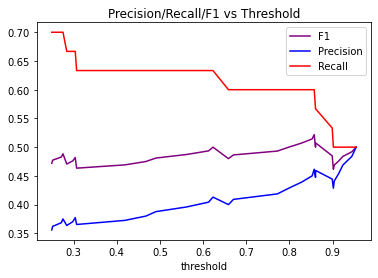

In [600]:
started_index = 60
end_index = 90

plt.plot(thresholds[started_index:end_index], all_f1[started_index:end_index], color='purple', label="F1")
plt.plot(thresholds[started_index:end_index], precision[started_index:end_index], color='blue', label="Precision")
plt.plot(thresholds[started_index:end_index], recall[started_index:end_index], color='red', label="Recall")

plt.legend()
plt.title('Precision/Recall/F1 vs Threshold')
plt.xlabel('threshold');


Let's inspect the Precision, Recall, and F1 scores at each threshold value.

In [360]:
for idx in range(started_index, end_index):
    print('==== Index: {}, Threshold: {:.6f}'.format(idx, thresholds[idx]))
    print('Recall is: {:.6f}'.format(recall[idx]))    
    print('Precision is: {:.6f}'.format(precision[idx]))
    print('F1 Score is: {:.6f}'.format(all_f1[idx]))

==== Index: 70, Threshold: 0.490754
Recall is: 0.633333
Precision is: 0.387755
F1 Score is: 0.481013
==== Index: 71, Threshold: 0.561324
Recall is: 0.633333
Precision is: 0.395833
F1 Score is: 0.487179
==== Index: 72, Threshold: 0.612773
Recall is: 0.633333
Precision is: 0.404255
F1 Score is: 0.493506
==== Index: 73, Threshold: 0.622887
Recall is: 0.633333
Precision is: 0.413043
F1 Score is: 0.500000
==== Index: 74, Threshold: 0.658748
Recall is: 0.600000
Precision is: 0.400000
F1 Score is: 0.480000
==== Index: 75, Threshold: 0.670370
Recall is: 0.600000
Precision is: 0.409091
F1 Score is: 0.486486
==== Index: 76, Threshold: 0.771974
Recall is: 0.600000
Precision is: 0.418605
F1 Score is: 0.493151
==== Index: 77, Threshold: 0.798512
Recall is: 0.600000
Precision is: 0.428571
F1 Score is: 0.500000
==== Index: 78, Threshold: 0.827951
Recall is: 0.600000
Precision is: 0.439024
F1 Score is: 0.507042
==== Index: 79, Threshold: 0.852523
Recall is: 0.600000
Precision is: 0.450000
F1 Score is:

Based on the data above, the threshold value at 0.85 gives a good balance between the Precision, Recall, and F1 scores and we will use it as a cut-off value decide whether the output value from the model is positive or negative.

In [596]:
idx = 79
print('==== Threshold is: '+ str(thresholds[idx]))
print('Recall is: '+ str(recall[idx]))    
print('Precision is: '+ str(precision[idx]))
print('F1 Score is: ' + str(all_f1[idx]))

==== Threshold is: 0.85252315
Recall is: 0.6
Precision is: 0.45
F1 Score is: 0.5142857142857143


##### Once you feel you are done training, you'll need to decide the proper classification threshold that optimizes your model's performance for a given metric (e.g. accuracy, F1, precision, etc.  You decide) 

In [601]:
## Find the threshold that optimize your model's performance,
## and use that threshold to make binary classification. Make sure you take all your metrics into consideration.

thresh = 0.85
testY = valY

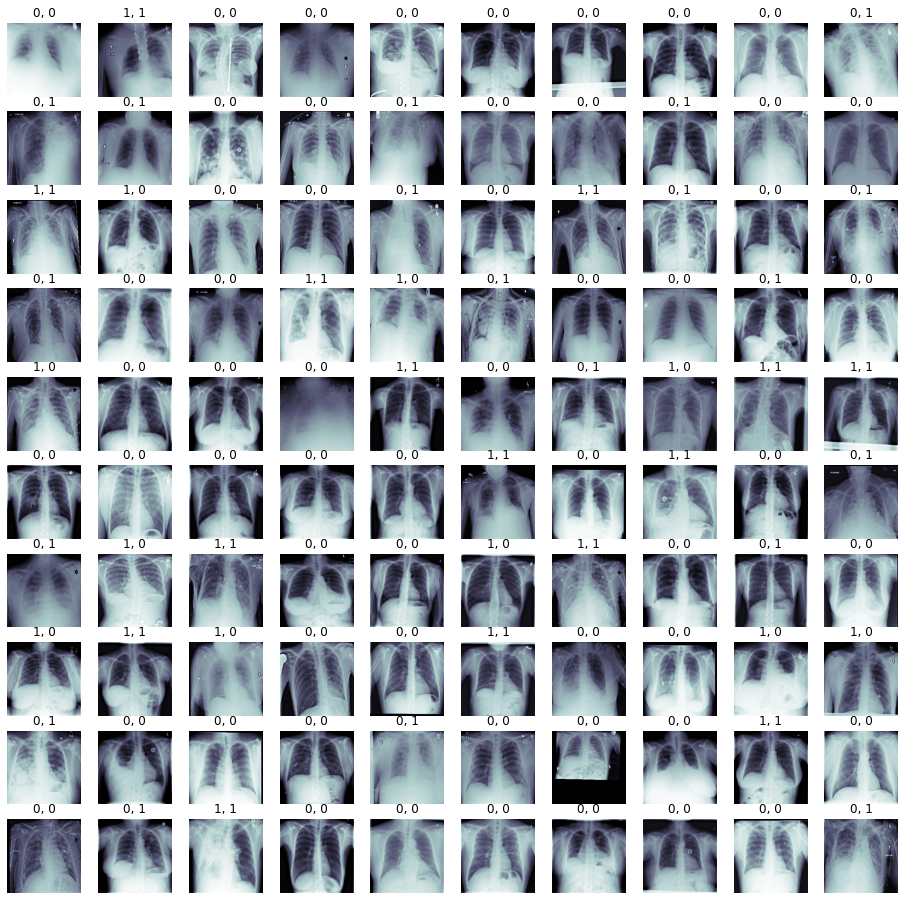

In [607]:
## Let's look at some examples of true vs. predicted with our best model: 

# Todo
val_ground_truth = [] 
val_out = []

fig, m_axs = plt.subplots(10, 10, figsize = (16, 16))
i = 0
for (c_x, c_y, c_ax) in zip(valX[0:100], testY[0:100], m_axs.flatten()):
    val_ground_truth.append(c_y)
    val_out.append(pred_Y[i] > thresh)
    
    c_ax.imshow(c_x[:,:,0], cmap = 'bone')
    if c_y == 1: 
        if pred_Y[i] > thresh:
            c_ax.set_title('1, 1')
        else:
            c_ax.set_title('1, 0')
    else:
        if pred_Y[i] > thresh: 
            c_ax.set_title('0, 1')
        else:
            c_ax.set_title('0, 0')
    c_ax.axis('off')
    i=i+1

### How about our model performed against the validation dataset?

In [610]:
confusion_matrix(val_ground_truth, val_out)

# tn | fp
# -------
# fn | tp

array([[56, 19],
       [10, 15]])

In [611]:
print('Accuracy: {}'.format(balanced_accuracy_score(val_ground_truth, val_out)))
print('Precision: {}'.format(precision_score(val_ground_truth, val_out)))
print('Recall: {}'.format(recall_score(val_ground_truth, val_out)))
print('F1 Score: {}'.format(f1_score(val_ground_truth, val_out)))

Accuracy: 0.6733333333333333
Precision: 0.4411764705882353
Recall: 0.6
F1 Score: 0.5084745762711865


Save the model so we can load it for future use

In [603]:
## Just save model architecture to a .json:

model_json = my_model.to_json()
with open("my_model.json", "w") as json_file:
    json_file.write(model_json)

## Additional Analysis

Since the validation dataset does not exactly represent the real world data where the Pneumonia cases are present only around 1.275% of the overall dataset. 

In this section, we will evaluate the model performance using the random data (around 22k records) where there is around 1.275% of Pneumonia cases in this dataset

In [612]:
_, test_data = train_test_split(df_xray_clean, 
                                   test_size = 0.2, 
                                   stratify = df_xray_clean['pneumonia_class'])

In [613]:
test_data.shape

(22421, 28)

In [614]:
test_data.pneumonia_class.sum()/test_data.shape[0]

0.01275589848802462

Next, get the predicted output of images in this dataset

In [615]:
# We must not shuffle the validation data here because we need to append
# the predicted output data to the test_data dataframe to perform the analysis
test_gen_final = make_val_gen(test_data, shuffle=False)

test_total_img = test_gen_final.n
test_batch_size = test_gen_final.batch_size

test_ground_truth = []
test_out_final = []

for testX_final, testY_final in test_gen_final:
    test_ground_truth.extend(testY_final.flatten())
    
    cur_out = my_model.predict(testX_final, batch_size = 128)
    cur_pred = cur_out >= thresh
    test_out_final.extend(cur_pred.flatten()) 
    
    if ((test_gen_final.total_batches_seen * test_batch_size) >= test_total_img):
        break

Found 22421 validated image filenames.


In [617]:
confusion_matrix(test_ground_truth, test_out_final)

# tn | fp
# -------
# fn | tp

array([[16233,  5902],
       [   38,   248]])

In [618]:
print('Accuracy: {}'.format(balanced_accuracy_score(test_ground_truth, test_out_final)))
print('Precision: {}'.format(precision_score(test_ground_truth, test_out_final)))
print('Recall: {}'.format(recall_score(test_ground_truth, test_out_final)))
print('F1 Score: {}'.format(f1_score(test_ground_truth, test_out_final)))

Accuracy: 0.8002481593400952
Precision: 0.040325203252032524
Recall: 0.8671328671328671
F1 Score: 0.07706650093225607


Then, added the predicted output to the dataframe so we can use it to perform the analysis

In [619]:
df_test_data = test_data.copy()

In [620]:
df_test_data['ground_truth'] = test_ground_truth
df_test_data['predict_output'] = test_out_final

In [621]:
df_test_data.sample(3)

,Image Index,Finding Labels,Follow-up #,Patient ID,Patient Age,Patient Gender,View Position,OriginalImage[Width,Height],OriginalImagePixelSpacing[x,...,Infiltration,Mass,No Finding,Nodule,Pleural_Thickening,Pneumonia,Pneumothorax,pneumonia_class,ground_truth,predict_output
77406,00019018_008.png,Cardiomegaly|Consolidation|Effusion|Infiltrati...,8,19018,28,M,AP,3056,2544,0.139,...,1.0,0.0,0.0,1.0,0.0,0.0,0.0,False,False,True
52210,00013177_003.png,No Finding,3,13177,25,F,PA,2992,2991,0.143,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,False,False,True
43408,00011192_000.png,No Finding,0,11192,38,M,PA,2992,2991,0.143,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,False,False,False


In [671]:
def plot_intensities(df, num_img=100):
    '''
    Function to plot a histogram of intensities x-ray images
    in the input data frame.
    Note that only 30 images will be used in this plot to save the computation time
    '''
    intensities = []
    for img_path in df['path'][:num_img]: 

        img = io.imread(img_path)
        img_mask = (img > 50) & (img < 250)
        intensities.extend(img[img_mask].tolist())
        
    plt.hist(intensities, bins=256);
    
    mode_val = scipy.stats.mode(intensities)[0][0]
    plt.title('Mode of intensities: {}'.format(mode_val))
    plt.axvline(mode_val, color='r', linestyle='dashed', linewidth=2);
    
    return intensities

def plot_imgs(df, num_rows = 6):
    '''
    Show the images using the 'path' column in the input dataframe
    By default, this function will show 5x6 images where a user can
    update the input num_rows value if needed
    '''
        
    fig, m_axs = plt.subplots(num_rows, 5, figsize = (16, 16))
    i = 0
    for (img_path, c_ax) in zip(df['path'][:30], m_axs.flatten()):
        img = io.imread(img_path)
        c_ax.imshow(img, cmap = 'bone')

        c_ax.axis('off')
        i=i+1

### Examples of True Positive

Below shows samples of True Positive cases - The model **correctly classifies an X-ray image with Pnemonia**.

This will be helpful to compare these samples with other cases in the confusion matrix.

In [623]:
df_test_tp = df_test_data[(df_test_data['pneumonia_class'] & df_test_data['predict_output'])]
print('Number of True Positive results: {}'.format(df_test_tp.shape[0]))

Number of True Positive results: 248


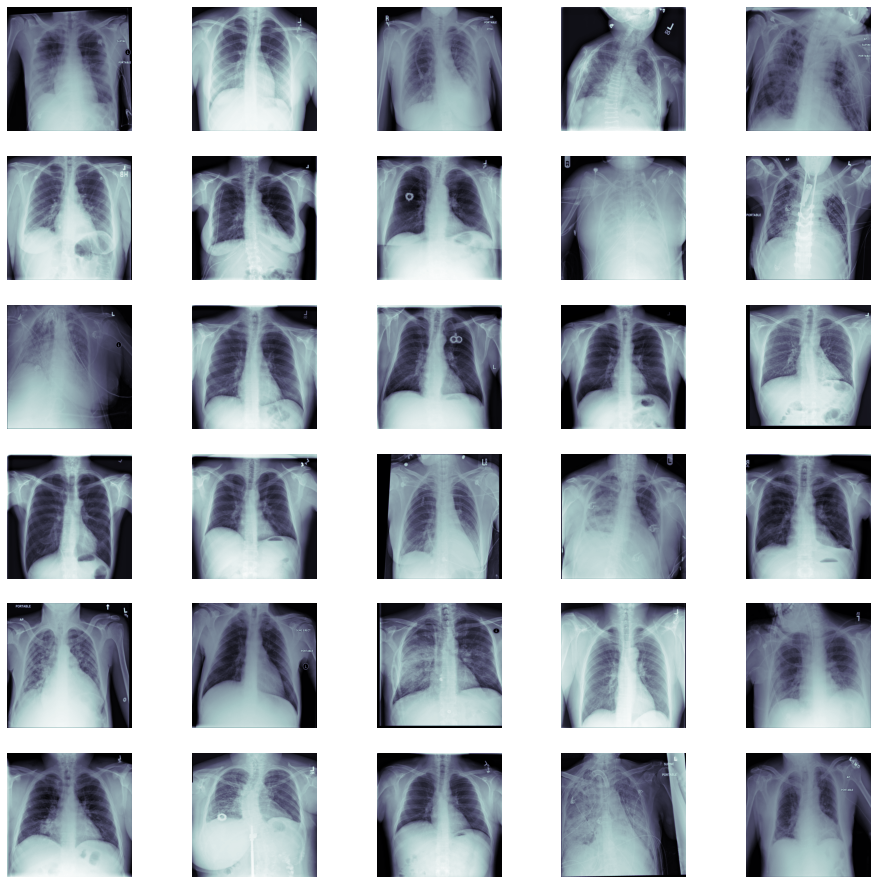

In [678]:
df_sample_tp = df_test_tp.sample(100)
plot_imgs(df_sample_tp)

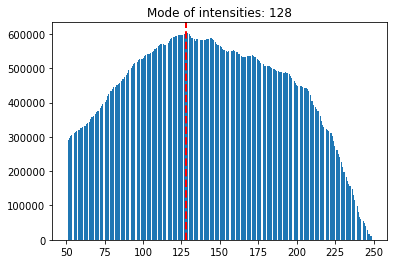

In [679]:
_ = plot_intensities(df_sample_tp)

### Examples of True Negative

Below shows samples of True Positive cases - The model **correctly classifies an X-ray image WITHOUT Pnemonia**.

This will be helpful to compare these samples with other cases in the confusion matrix.

We will also take a closer look at records with the following labels in the True Negative bucket since they are the top cases there were mis-classified in the False Negative and False Positive buckets:
* No Finding
* Infiltration
* Effusion
* Atelectasis

In [626]:
df_test_tn = df_test_data[~df_test_data['pneumonia_class'] & ~df_test_data['predict_output']]

print('Number of True Negative results: {}'.format(df_test_tn.shape[0]))

Number of True Negative results: 16233


#### True Negative: No Finding

In [627]:
df_test_tn_no_finding = df_test_tn[df_test_tn['Finding Labels'] == 'No Finding']
df_test_tn_no_finding.shape

(9661, 30)

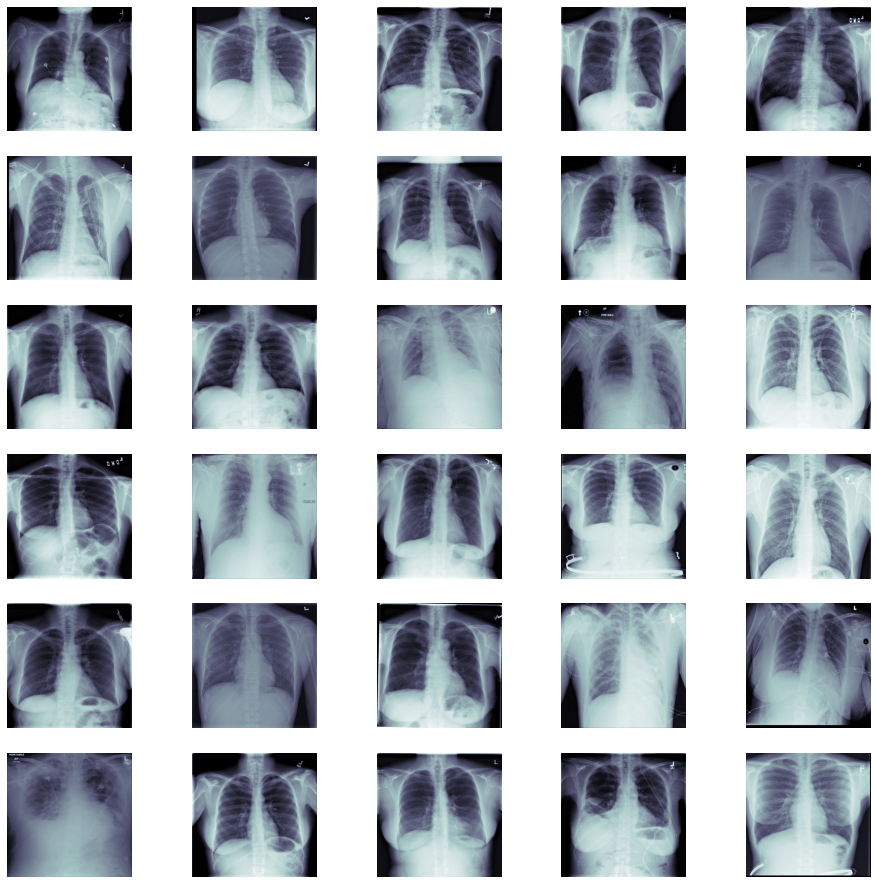

In [680]:
df_sample_tn_no_finding = df_test_tn_no_finding.sample(100)
plot_imgs(df_sample_tn_no_finding)

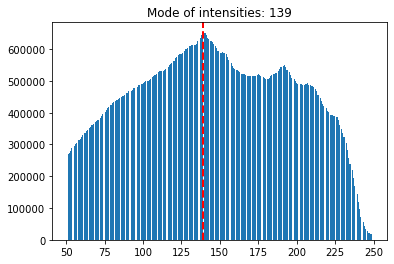

In [681]:
_ = plot_intensities(df_sample_tn_no_finding)

#### True Negative: Infiltration

In [630]:
df_test_tn_infiltration = df_test_tn[df_test_tn['Finding Labels'] == 'Effusion']
df_test_tn_infiltration.shape

(484, 30)

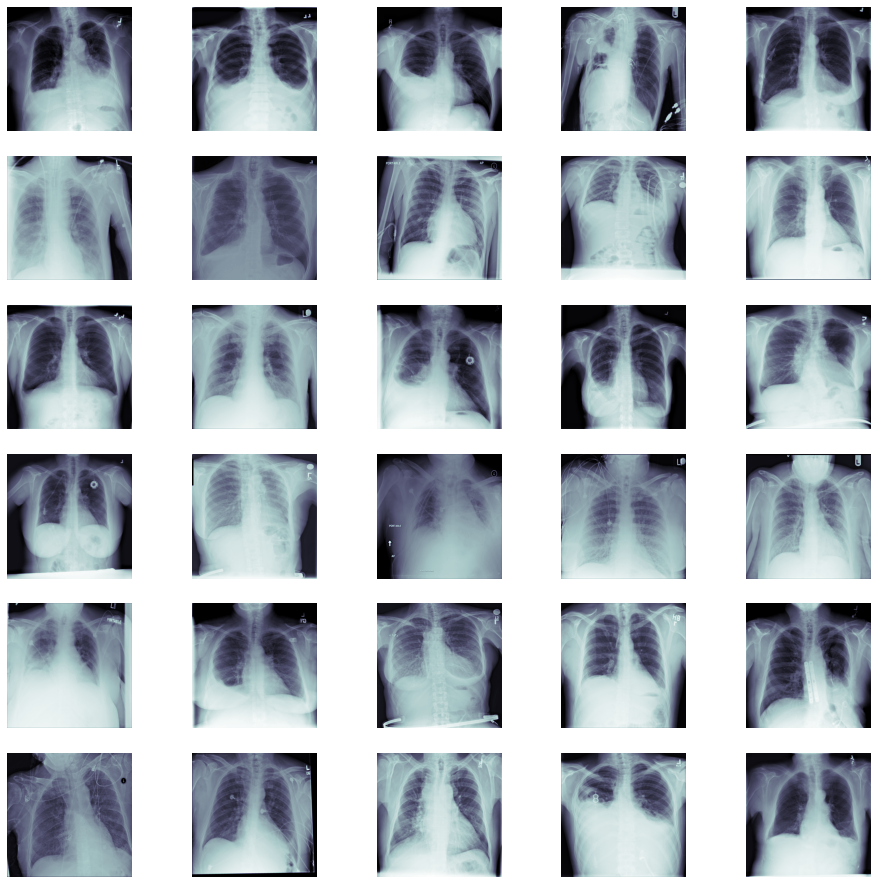

In [682]:
df_sample_tn_infiltration = df_test_tn_effusion.sample(100)
plot_imgs(df_sample_tn_infiltration)

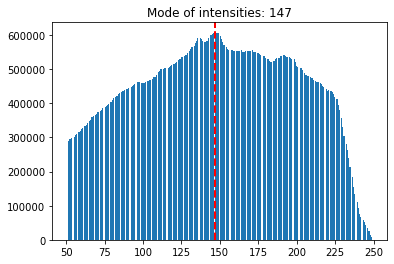

In [683]:
_ = plot_intensities(df_sample_tn_infiltration)

#### True Negative: Effusion

In [633]:
df_test_tn_effusion = df_test_tn[df_test_tn['Finding Labels'] == 'Effusion']
df_test_tn_effusion.shape

(484, 30)

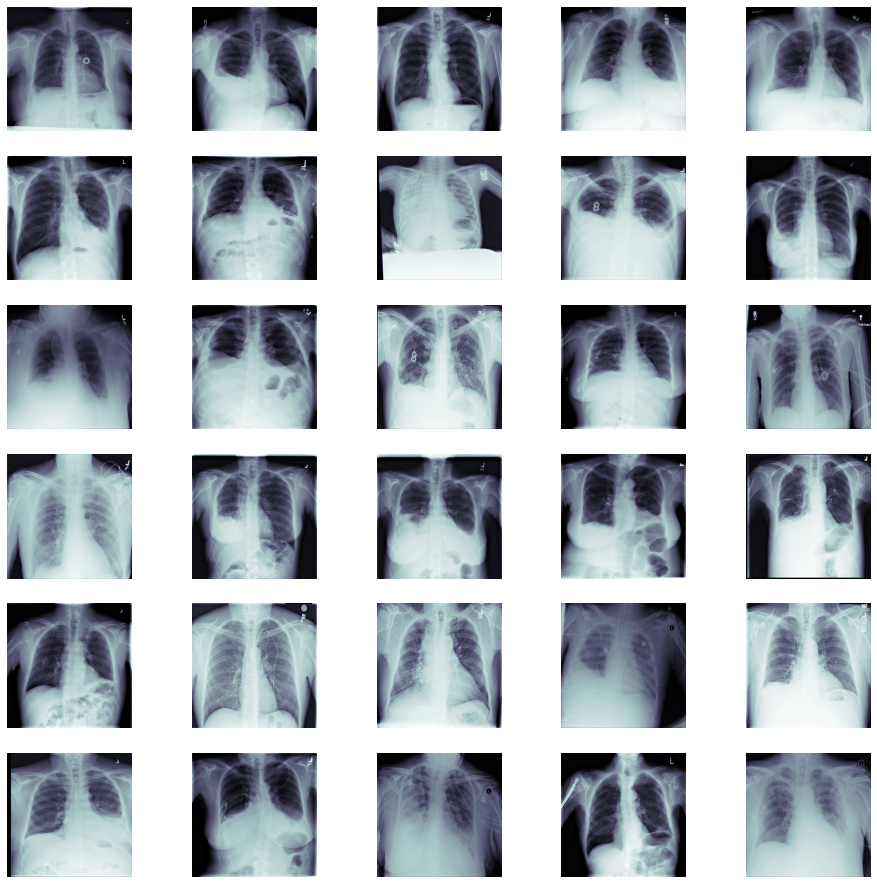

In [684]:
df_sample_tn_effusion = df_test_tn_effusion.sample(100)
plot_imgs(df_sample_tn_effusion)

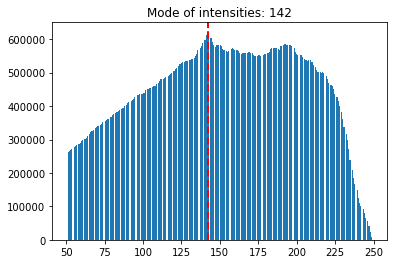

In [685]:
_ = plot_intensities(df_sample_tn_effusion)

#### True Negative: Atelectasis

In [636]:
df_test_tn_atelectasis = df_test_tn[df_test_tn['Finding Labels'] == 'Atelectasis']
df_test_tn_atelectasis.shape


(623, 30)

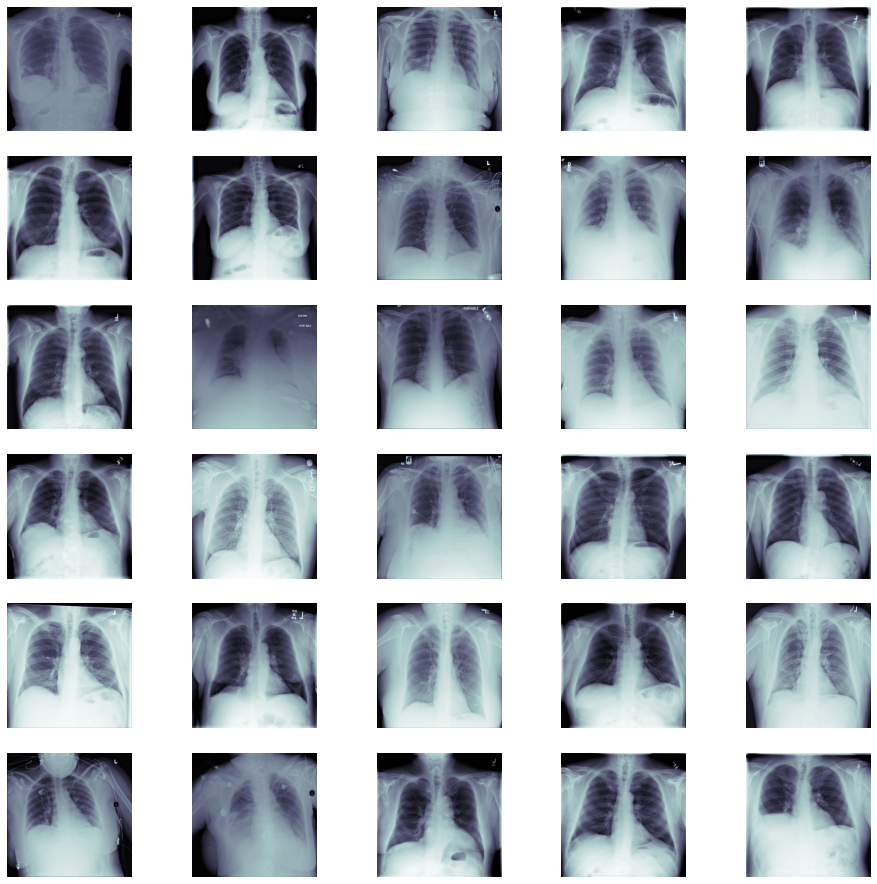

In [686]:
df_sample_tn_atelectasis = df_test_tn_atelectasis.sample(100)
plot_imgs(df_sample_tn_atelectasis)

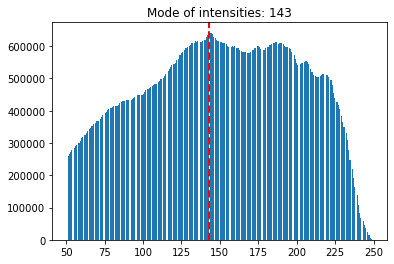

In [687]:
_ = plot_intensities(df_sample_tn_atelectasis)

### Analysis for False Negative

Since we chose a cut-off value which gave a good balance of the Precision, Recall, and F1 scores, this will help reduce a number of False Negative cases as you can see that there are only 38 cases in this bucket (Mis-classifying an x-ray with Pneumonia as Negative when it should be positive).

Based on the initial observation, the X-ray images of records in this categories have a large portion of high intensities (bright) areas that are blended over a large portion of those images and these might cause the model to perform poorly in those cases.

In [639]:
df_test_fn = df_test_data[df_test_data['pneumonia_class'] & (df_test_data['pneumonia_class'] ^ df_test_data['predict_output'])]

In [640]:
df_test_fn.shape

(38, 30)

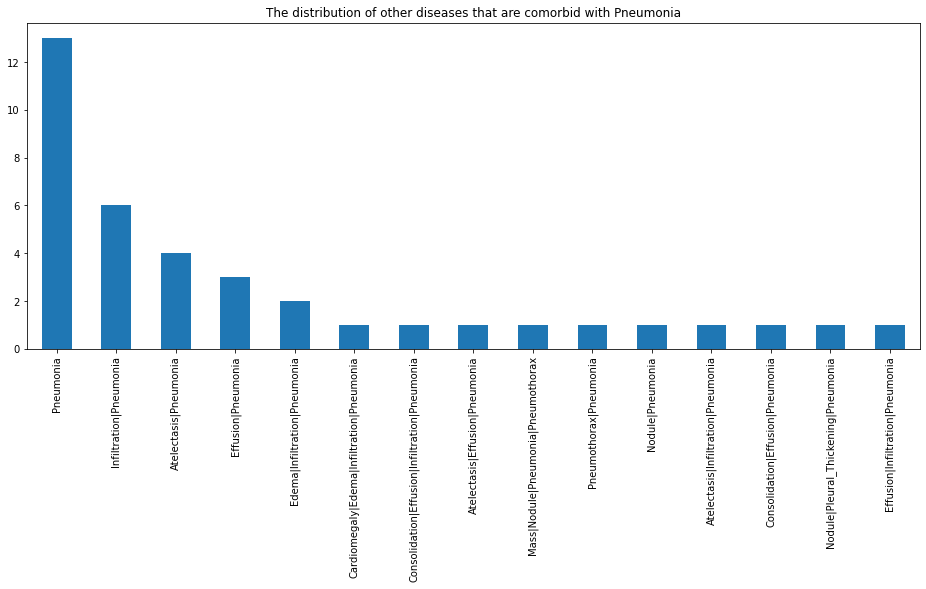

In [641]:
plt.figure(figsize=(16,6))
df_test_fn['Finding Labels'].value_counts().plot(kind='bar');
plt.title('The distribution of other diseases that are comorbid with Pneumonia');

In [642]:
df_test_fn_pneumonia_only = df_test_fn[df_test_fn['Finding Labels'] == 'Pneumonia']

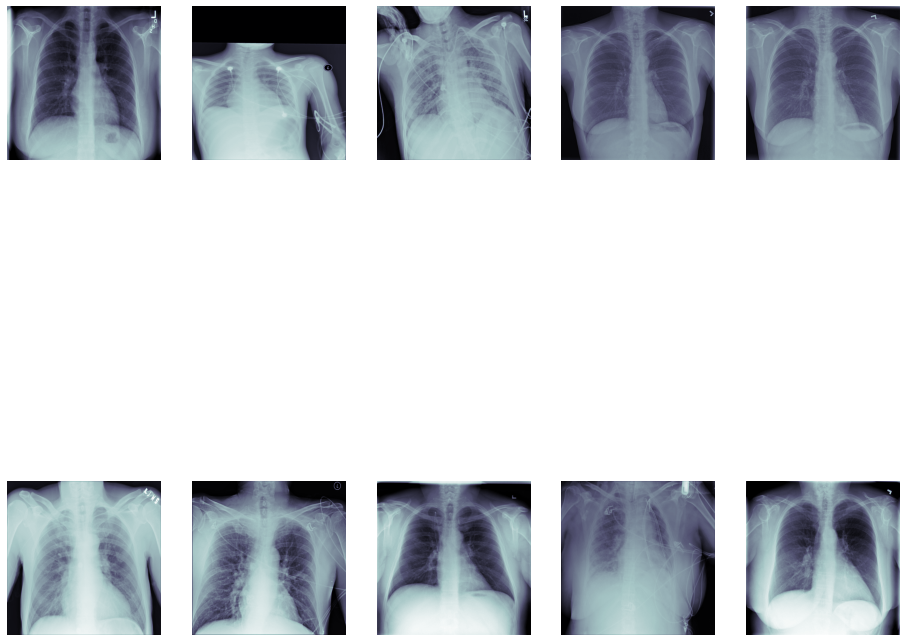

In [643]:
plot_imgs(df_test_fn_pneumonia_only, num_rows=2)

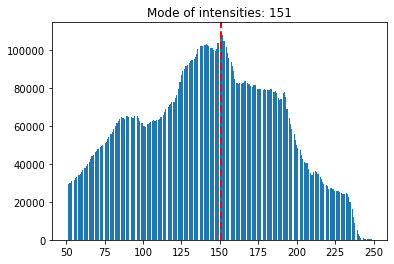

In [644]:
_ = plot_intensities(df_test_fn_pneumonia_only)

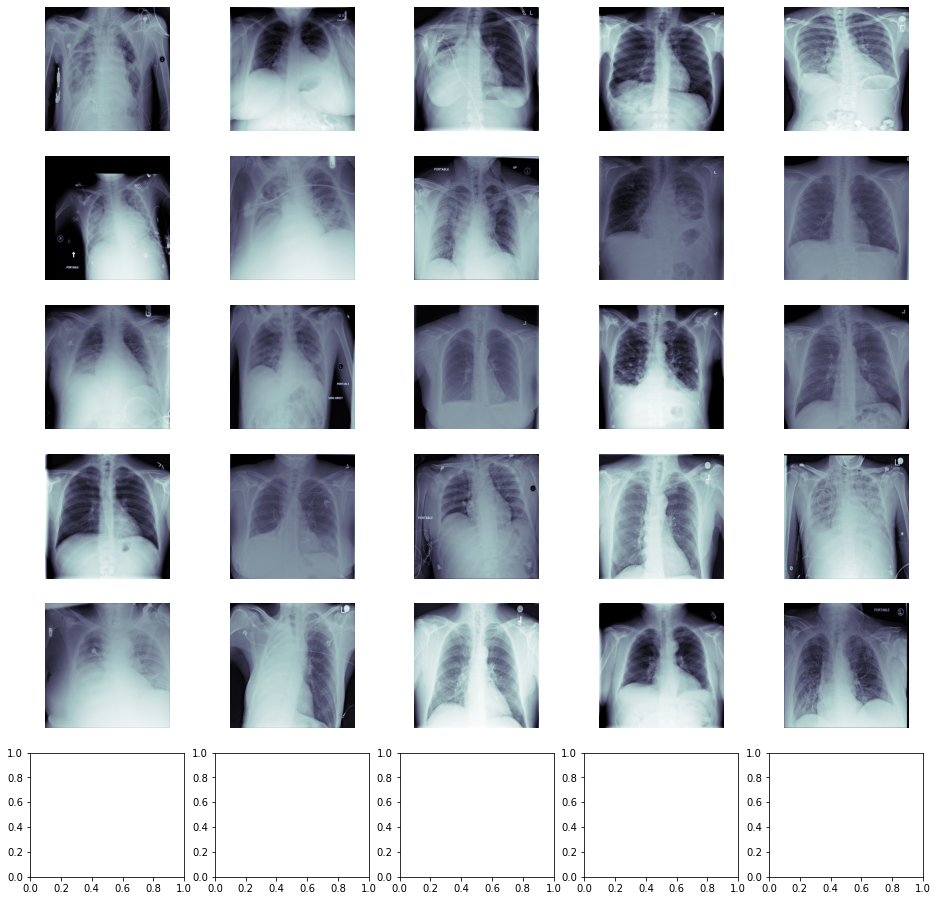

In [645]:
df_test_fn_pneumonia_others = df_test_fn[df_test_fn['Finding Labels'] != 'Pneumonia']
plot_imgs(df_test_fn_pneumonia_others)

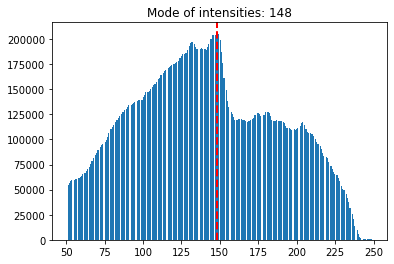

In [646]:
_ = plot_intensities(df_test_fn_pneumonia_others)

### Analysis for False Positive

In the False Positive category, our model mis-classifies an x-ray image **WITHOUT** Pneumonia as **POSITIVE**.

In the actual clitical setting, this will have less impact than the False Negative category since the intended use for this model is to assist a radiologist to classify an x-ray image with Pneumonia.

As shown in the bar chart below, the top label that got misclassified the most are x-ray images with the 'No Finding' label. After inspecting the samples of those x-ray images, it seems that those x-ray images have a large portion of high intensities (bright) areas that might match the pattern of x-ray images with Pneumonia learned by the model.

In [647]:
df_test_fp = df_test_data[(~df_test_data['pneumonia_class'] & df_test_data['predict_output'])]

In [648]:
df_test_fp.shape

(5902, 30)

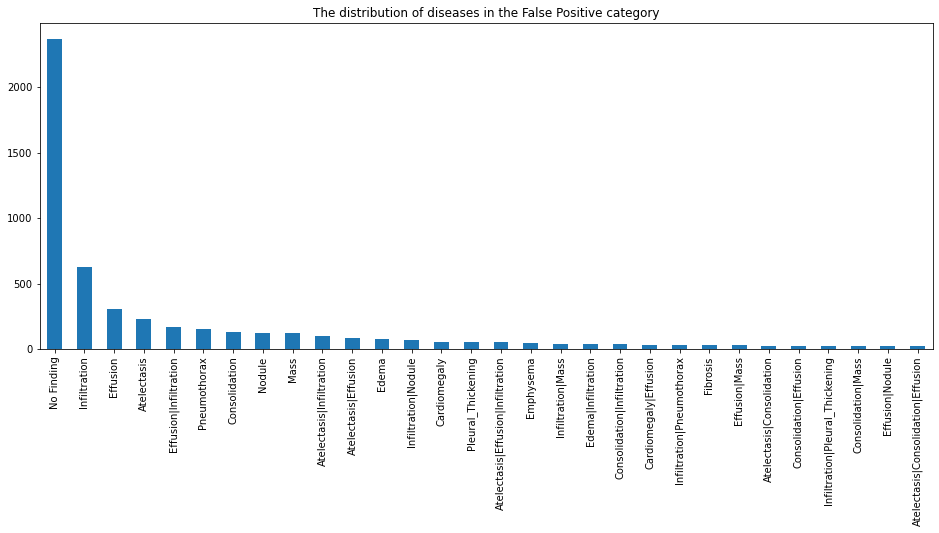

In [670]:
plt.figure(figsize=(16,6))
df_test_fp['Finding Labels'].value_counts()[:30].plot(kind='bar');
plt.title('The distribution of diseases in the False Positive category');

#### False Positive - No Finding

In [650]:
df_test_fp_no_finding = df_test_fp[df_test_fp['Finding Labels'] == 'No Finding']
df_test_fp_no_finding.shape

(2372, 30)

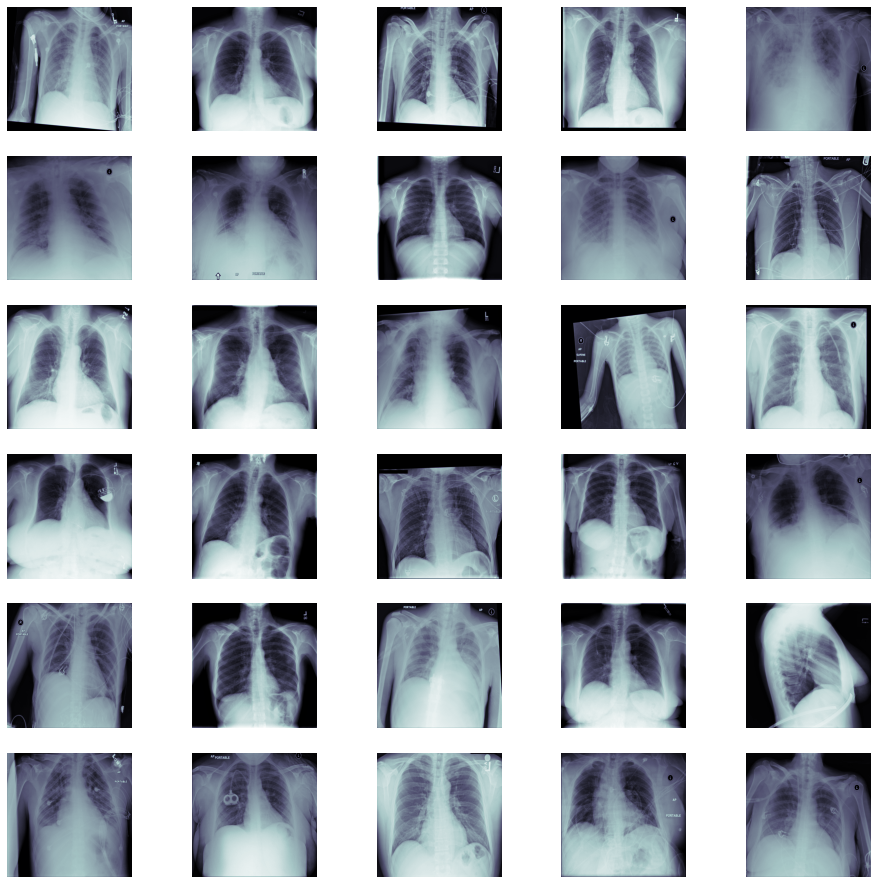

In [688]:
df_sample_fp_no_finding = df_test_fp_no_finding.sample(100)
plot_imgs(df_sample_fp_no_finding)

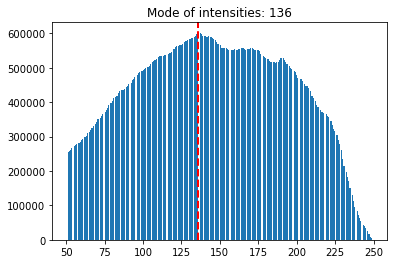

In [689]:
_ = plot_intensities(df_sample_fp_no_finding)

#### False Positive - Infiltration

In [653]:
df_test_fp_infiltration = df_test_fp[df_test_fp['Finding Labels'] == 'Infiltration']
df_test_fp_infiltration.shape

(629, 30)

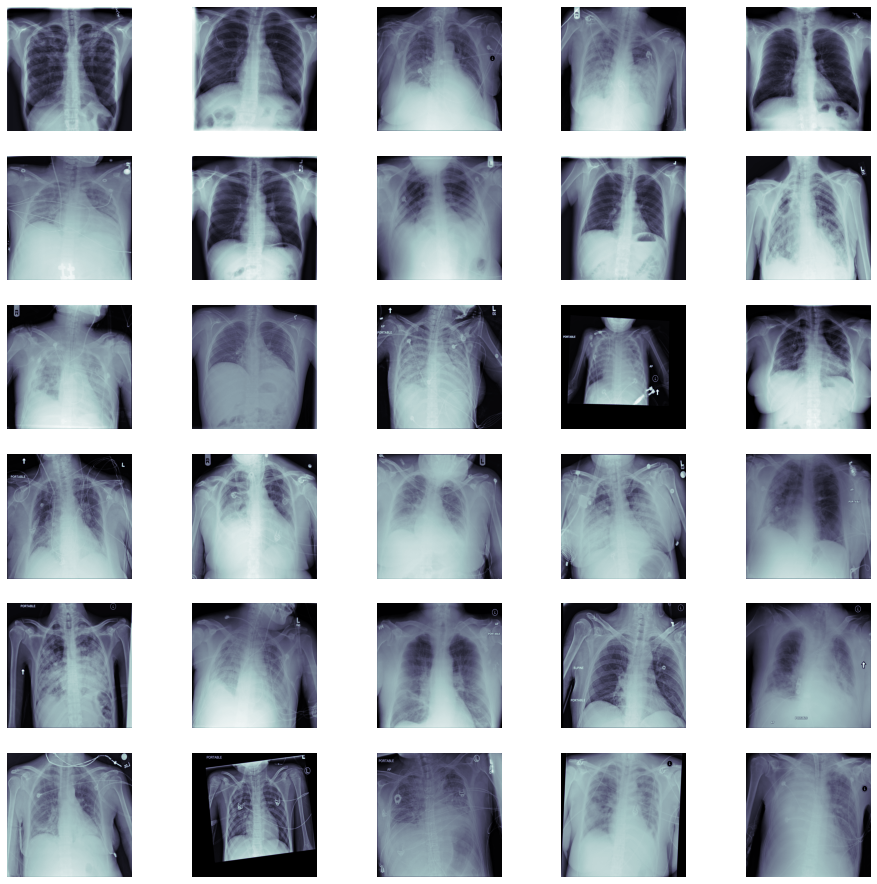

In [690]:
df_sample_fp_infiltration = df_test_fp_infiltration.sample(100)
plot_imgs(df_sample_fp_infiltration)

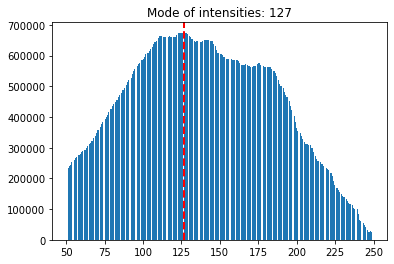

In [691]:
_ = plot_intensities(df_sample_fp_infiltration)

#### False Positive - Effusion

In [705]:
df_test_fp_effusion = df_test_fp[df_test_fp['Finding Labels'] == 'Effusion']
df_test_fp_effusion.shape

(303, 30)

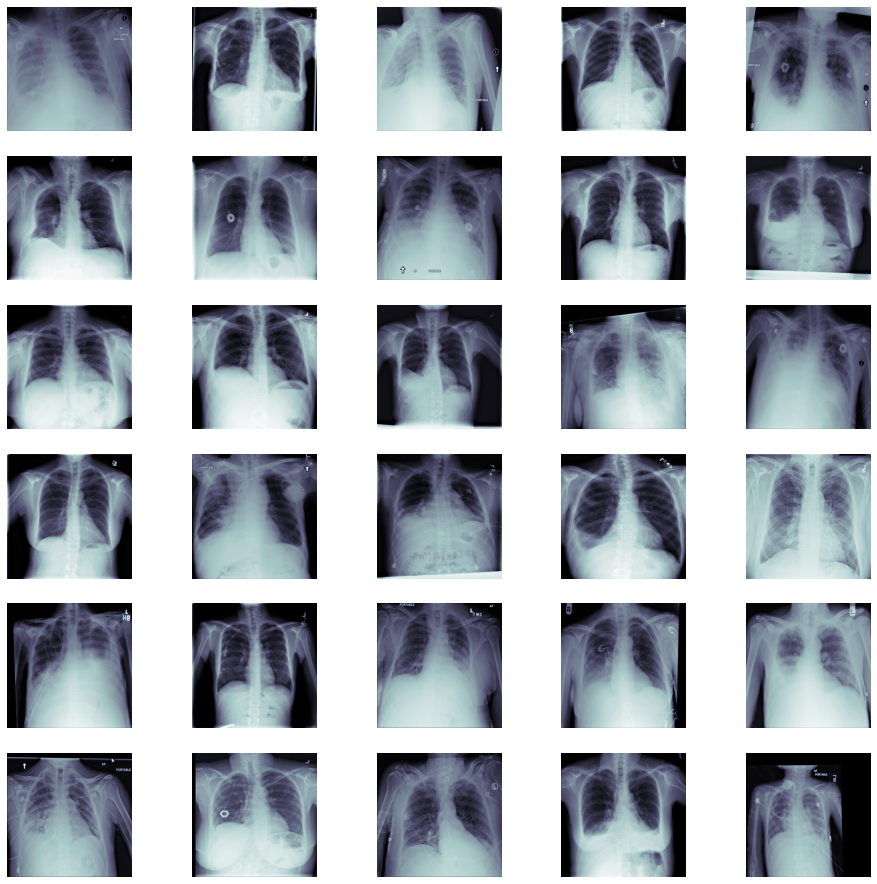

In [706]:
df_sample_fp_effusion = df_test_fp_effusion.sample(100)
plot_imgs(df_sample_fp_effusion)

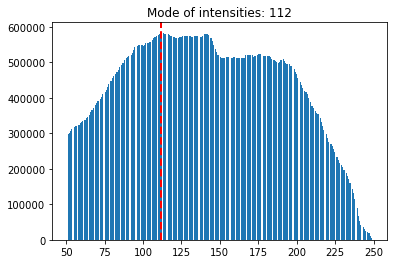

In [707]:
_ = plot_intensities(df_sample_fp_effusion)

#### False Positive - Atelectasis

In [708]:
df_test_fp_atelectasis = df_test_fp[df_test_fp['Finding Labels'] == 'Atelectasis']
df_test_fp_atelectasis.shape

(231, 30)

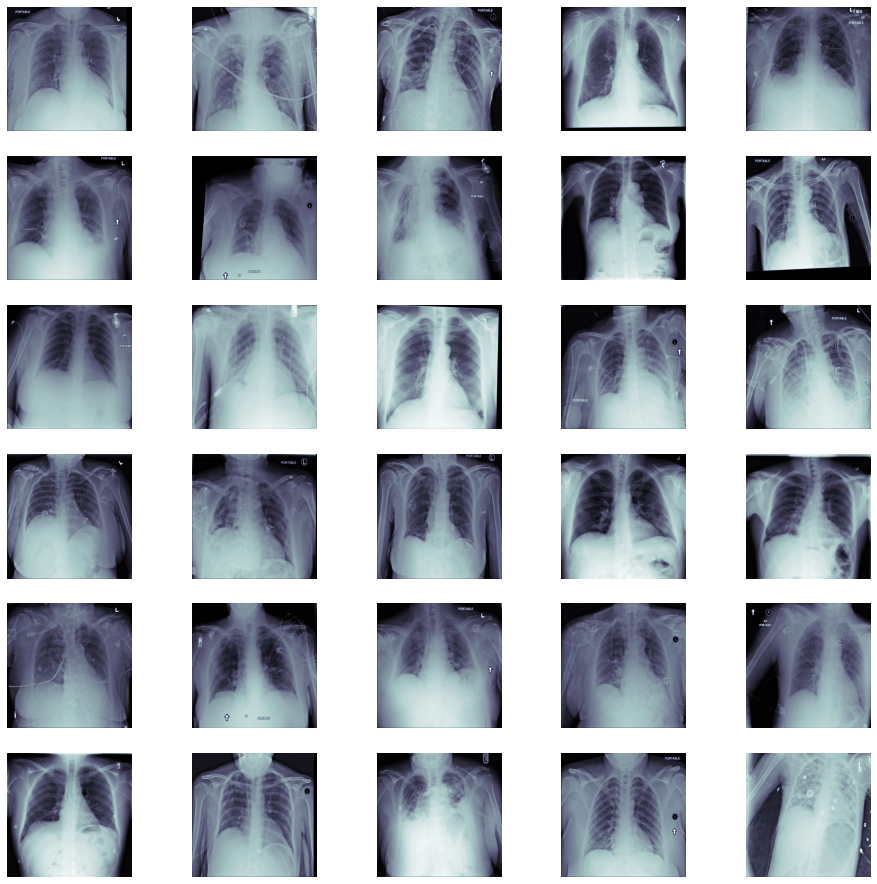

In [709]:
df_sample_fp_atelectasis = df_test_fp_atelectasis.sample(100)
plot_imgs(df_sample_fp_atelectasis)

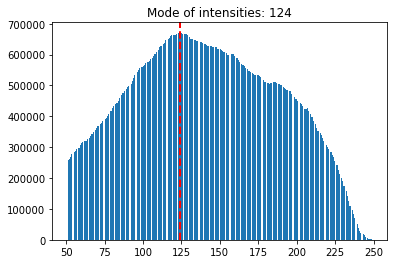

In [710]:
_ = plot_intensities(df_sample_fp_atelectasis)

## Differences in intensities

At a quick glance, the distributions of intentities of x-ray images that are mis-classified as False Positive look similar to the distribution of intensities of x-ray images with Pneumonia that are correctly classified (True Positive). 

Would this be one of the reasons why our model mis-classify those images?

### True Positive

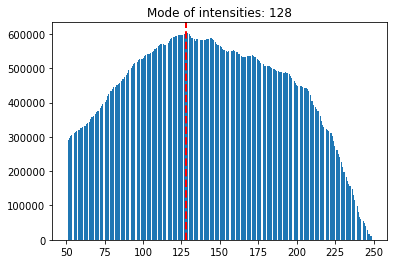

In [696]:
# Let's plot the intensities of the True Positive cases (x-ray images with Pneumonia) 
# that we can use as a baseline
_ = plot_intensities(df_sample_tp)

### No Finding

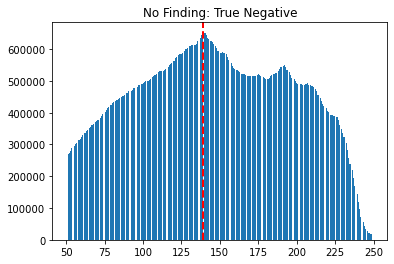

In [697]:
_ = plot_intensities(df_sample_tn_no_finding)
plt.title('No Finding: True Negative');

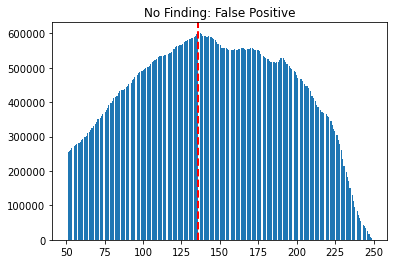

In [698]:
_ = plot_intensities(df_sample_fp_no_finding)
plt.title('No Finding: False Positive');

### Infiltration

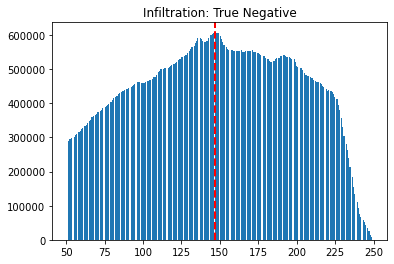

In [699]:
_ = plot_intensities(df_sample_tn_infiltration)
plt.title('Infiltration: True Negative');

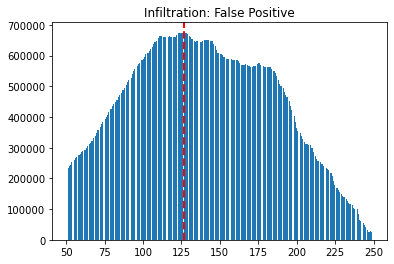

In [700]:
_ = plot_intensities(df_sample_fp_infiltration)
plt.title('Infiltration: False Positive');

### Effusion

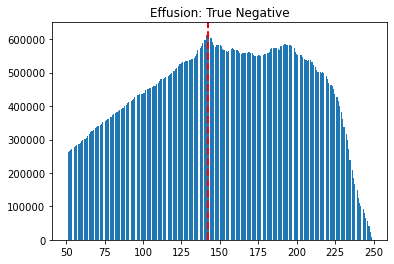

In [701]:
_ = plot_intensities(df_sample_tn_effusion)
plt.title('Effusion: True Negative');

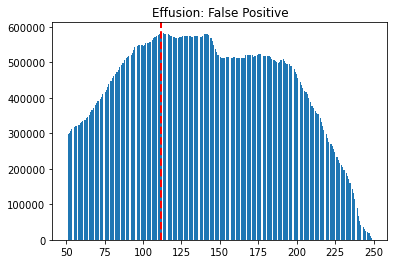

In [711]:
_ = plot_intensities(df_sample_fp_effusion)
plt.title('Effusion: False Positive');

### Atelectasis

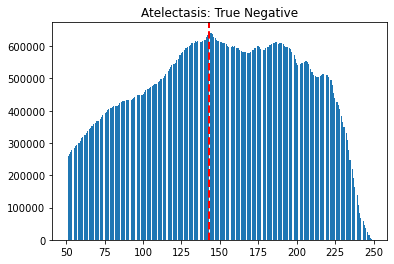

In [703]:
_ = plot_intensities(df_sample_tn_atelectasis)
plt.title('Atelectasis: True Negative');

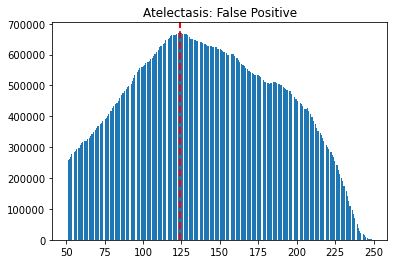

In [712]:
_ = plot_intensities(df_sample_fp_atelectasis)
plt.title('Atelectasis: False Positive');